## Plot creation code for GDELT Analysis

### Setup

In [ ]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
import itertools as it
import torch as pt
import tqdm
import pyproj as pp
import shapely.geometry as geom
from matplotlib import colormaps as cmaps

import sqlite3
import datetime as dt

from GDELTAnomalies.datasets import gdelt_pt_dataset

In [2]:
wgs84 = pp.CRS.from_epsg(4326)
web = pp.CRS.from_epsg(3857)

In [3]:
data = pd.read_csv("sampledata.csv")

/tmp/ipykernel_1926320/2674561073.py:1: DtypeWarning: Columns (9,12,19,22,56) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("sampledata.csv")


### Raw Dataset plots

For the raw dataset, we can plot each point's ActionGeo and color by actor. This example also puts the spatial grid down.

In [5]:
geometry = gpd.points_from_xy(data["ActionGeo_Long"], data["ActionGeo_Lat"], crs=wgs84)

In [6]:
geodata = gpd.GeoDataFrame(data, geometry=geometry, crs=wgs84)
geodata2 = geodata.to_crs(web)

In [7]:
latmin = 19
latmax = 62.5
lonmin = 10
lonmax = 60

vert_lines = [10 + 10 * x for x in range(6)][1:-1]
h_lines = [19.5 + 5 * x for x in range(9)][1:]

lines_list = [geom.LineString([(lonmin, x), (lonmax, x)]) for x in h_lines] + [geom.LineString([(x, latmin), (x, latmax)]) for x in vert_lines]
grid = gpd.GeoDataFrame(geometry=lines_list, crs=wgs84)
grid2 = grid.to_crs(web)

Text(0.5, 1.0, 'GDELT Data by Actor, February 2016')

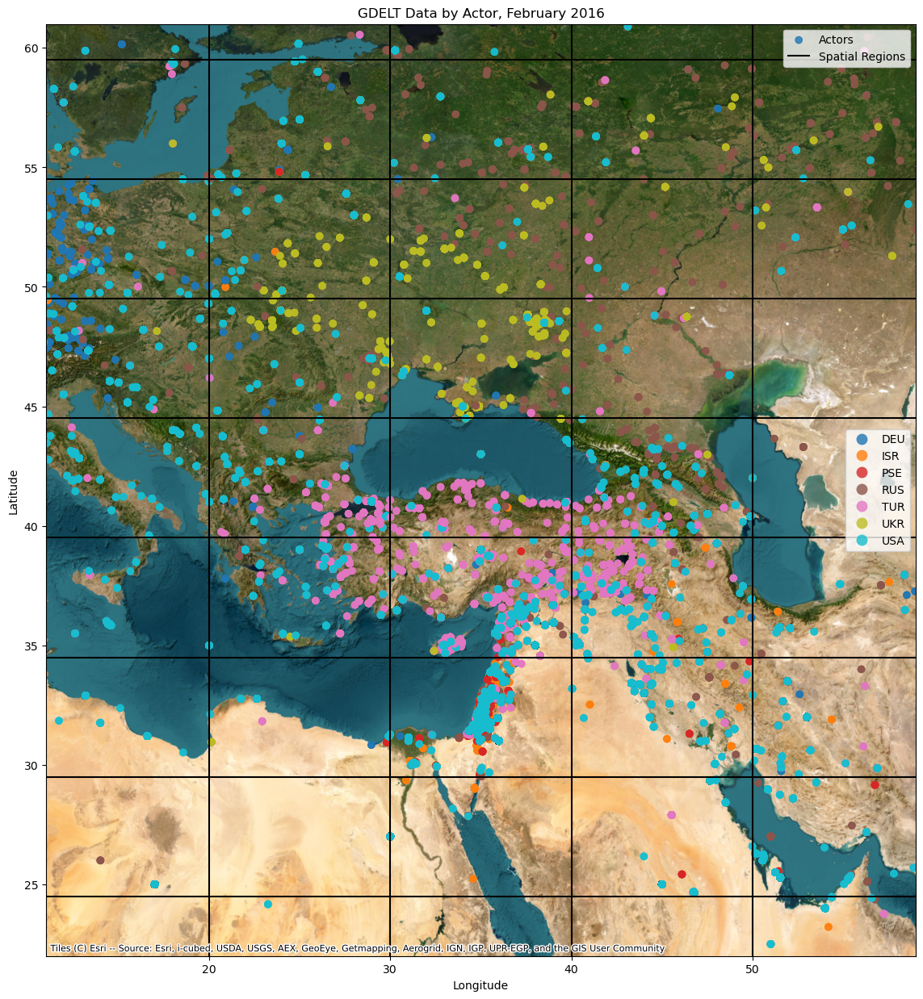

In [8]:
fig, ax = plt.subplots(figsize=(15,15))
hmm = geodata.plot(ax=ax, column="Actor1CountryCode", label="Actors", legend=True, alpha=0.8, cmap="tab10")
grid.plot(ax=ax, color="black", label="Spatial Regions")

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.ylim(22, 61)
plt.xlim(11, 59)

cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery, crs=wgs84, zoom=6)
ax.add_artist(hmm.get_legend())
ax.legend(loc="upper right")
plt.title("GDELT Data by Actor, February 2016")

### Plotting Predictions and Aggregated Dataset

After aggregation, we have 105 time series per spatial location, if plotting only one of these we can use a heatmap or points at the centroids of each of the grid cells. 

In [9]:
dataset = gdelt_pt_dataset.GDELTDataset(lookback=10, horizon=1, step=1, flatten=False, dtype=pt.float32, return_index=True)

In [10]:
dataset.lonAvg - 5

tensor([10., 10., 10.,  ..., 50., 50., 50.])

In [ ]:
def get_plottable(predictions: np.ndarray, colnames: list) -> tuple:
    """Puts predictions into nice geopandas dataframes for easy plotting"""
    if predictions.shape[0] == dataset.num_series:
        lonMin = dataset.lonAvg - 5
        lonMax = dataset.lonAvg + 5
        latMin = dataset.latAvg - 2.5
        latMax = dataset.latAvg + 2.5
        countries = dataset.countries
        events = dataset.events

        boxdata = {}
        pointgeom = []
        pointEntries = []
        allXpoints = set()
        allYpoints = set()
        xticks = []
        yticks = []
        for i in range(len(lonMin)):
            xmin = lonMin[i].item()
            xmax = lonMax[i].item()
            ymin = latMin[i].item()
            ymax = latMax[i].item()
            
            box = geom.box(xmin, ymin, xmax, ymax)
            if box in boxdata:
                boxdata[box].append((countries[i], events[i], predictions[i]))
            else:
                boxdata[box] = [(countries[i], events[i], predictions[i])]

            ypoints = np.linspace(ymin + 0.75, ymax - 0.75, dataset.countryDf.shape[1])
            xpoints = np.linspace(xmin + 1.5, xmax - 1.5, dataset.eventDf.shape[1])
            
            if np.sum(ypoints) not in allYpoints:
                allYpoints.add(np.sum(ypoints))
                yticks.append(ypoints)
            if np.sum(xpoints) not in allXpoints:
                allXpoints.add(np.sum(xpoints))
                xticks.append(xpoints)

            countryNum = np.argwhere((dataset.countryDf.columns == countries[i])[::-1]).item()
            eventNum = np.argwhere((dataset.eventDf.columns == events[i])[::-1]).item()
            
            pointgeom.append(geom.Point(xpoints[eventNum], ypoints[countryNum]))
            pointEntries.append(predictions[i].tolist() + [countries[i], events[i]])

        boxResult = []
        boxGeom = []
        for label in boxdata:
            stuff = boxdata[label]
            boxGeom.append(label)
            
            boxCountries, boxEvents, boxData = zip(*stuff)
            resultname = [x + "_" + y for x, y in zip(boxCountries, boxEvents)]
            resultname = [x + "_" + y for x, y in it.product(resultname, colnames)]
            result = np.array(boxData).flatten()
            boxResult.append(pd.Series(result, resultname))

        boxData = gpd.GeoDataFrame(boxResult, geometry=boxGeom)
        pointData = gpd.GeoDataFrame(pointEntries, columns=colnames + ["Actor", "Event"], geometry=pointgeom)

        return boxData, pointData, dataset.countryDf.columns, dataset.eventDf.columns, list(it.chain(*xticks)), list(it.chain(*yticks))
    else:
        raise ValueError(f"Must give all {dataset.num_series} series")

Make some random prediction so we can figure out how to make our plots

In [12]:
boxes, points, countries, events, xticks, yticks = get_plottable(np.random.random((4200, 2)), colnames=["col1", "col2"])

Beginnings of the heatmap plot: 

This needs better color blending than is available in matplotlib, for now I show blending with terrain or topographic imagery.

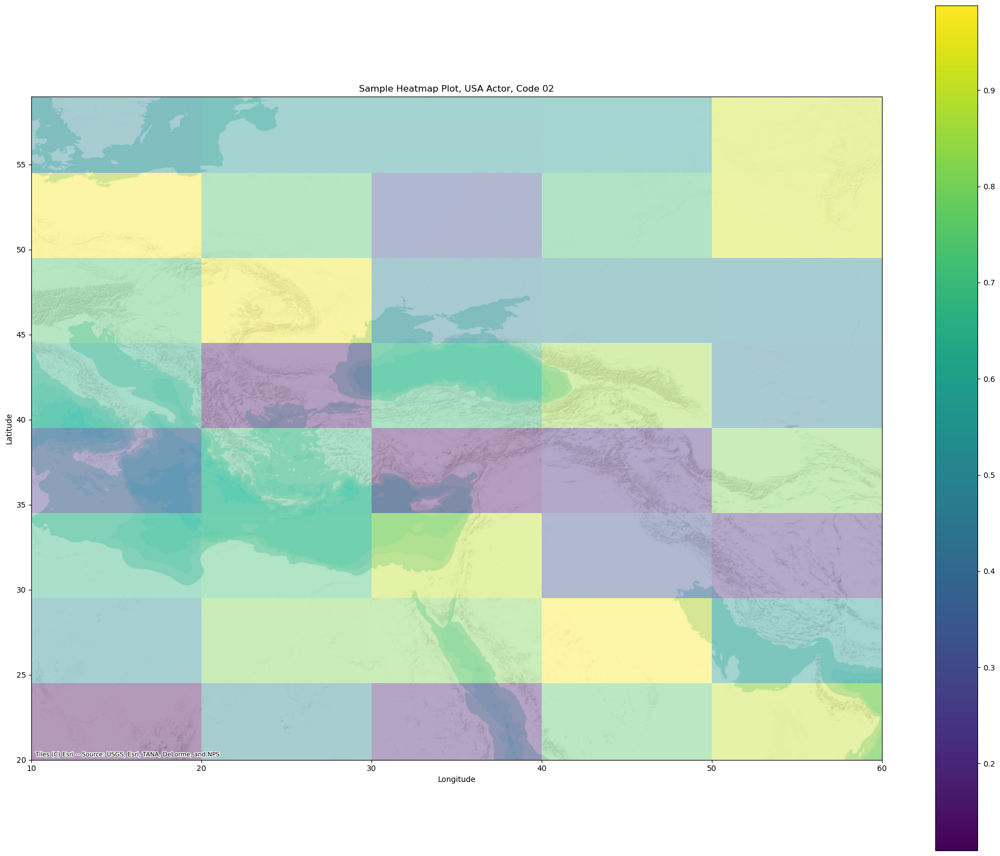

In [30]:
fig, ax = plt.subplots(figsize=(25, 20))
boxes.plot(column="USA_02_col1", ax=ax, alpha=0.4, legend=True)
# grid.plot(ax=ax, color="black")
plt.title("Sample Heatmap Plot, USA Actor, Code 02")
plt.ylabel("Latitude")
plt.xlabel("Longitude")
plt.xlim(10,60)
plt.ylim(20, 59)
cx.add_basemap(ax, source=cx.providers.Esri.WorldTerrain, crs=wgs84, zoom=6)

To visualize all series at once, we can use a bunch of points, one for each series, within each spatial location:

Text(0.5, 1.0, 'Sample Predictions Image, All Series at Once')

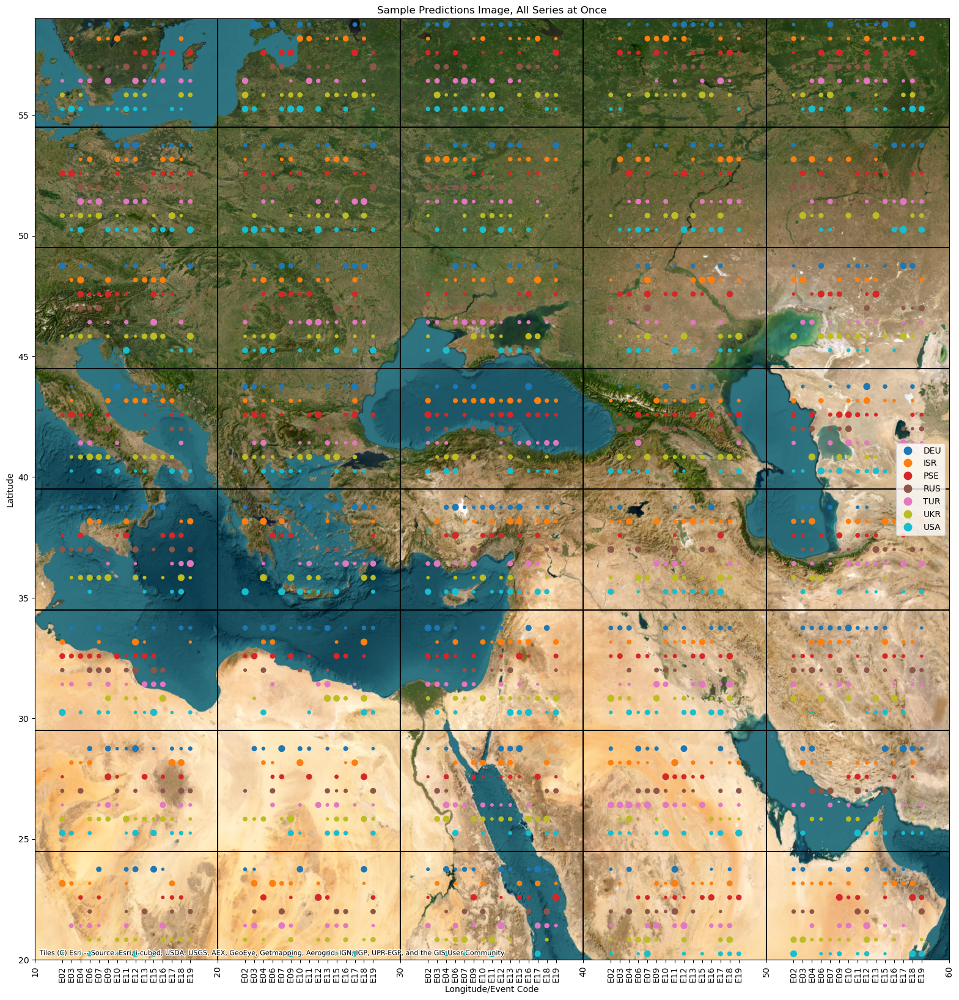

In [29]:
fig, ax = plt.subplots(figsize=(30, 20))
points.plot(column="Actor", markersize=np.exp(points["col1"] * 4) * (points["col1"] > 0.5), ax=ax, legend=True)
currticks = ax.get_xticks()
currticklabels = ax.get_xticklabels()
grid.plot(ax=ax, color="black", label="Spatial Regions")

addticks = xticks
cycler = it.cycle(events)
addticklabels = ["E" + next(cycler) for i in range(len(addticks))]
ax.set_xticks(list(currticks) + addticks)
ax.set_xticklabels(currticklabels + addticklabels, rotation=90)
plt.xlim(10,60)
plt.ylim(20, 59)
plt.xlabel("Longitude/Event Code")
plt.ylabel("Latitude")
cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery, crs=wgs84, zoom=6)
plt.title("Sample Predictions Image, All Series at Once")